In [ ]:
#import the libraries
import pandas as pd
import numpy as np

%matplotlib inline
import seaborn as sns
import matplotlib.pyplot as plt

from numpy.random import seed
from numpy.random import randn
from numpy import mean
from numpy import std

from statsmodels.graphics.gofplots import qqplot
from scipy.stats import shapiro
from scipy.stats import normaltest
from scipy.stats import anderson


from statsmodels.formula.api import ols
import scipy.stats
from scipy import stats
import statsmodels.api as sm

import missingno as mano

import seaborn as sns

In [ ]:
# Read car_features.xls
df = pd.read_csv('/content/telecom_customer_churn.csv')


<h2>Data Set Description</h2>

In [ ]:
df.dtypes

In [ ]:
df.describe()

In [ ]:
df.head()

<h2>Handling Missing Values</h2>

In [ ]:
df.isnull().sum()

<p>Looking for any possible patterns in the misingness of values</p>

In [ ]:
mano.bar(df)

In [ ]:
mano.matrix(df)

In [ ]:
mano.heatmap(df)

In [ ]:
missing_internet = df[df['Internet Service']== "No"]

missing_internet

,Customer ID,Gender,Age,Married,Number of Dependents,City,Zip Code,Latitude,Longitude,Number of Referrals,...,Payment Method,Monthly Charge,Total Charges,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Total Revenue,Customer Status,Churn Category,Churn Reason
20,0023-UYUPN,Female,79,Yes,0,Ahwahnee,93601,37.375816,-119.739935,0,...,Bank Withdrawal,25.20,1306.30,0.00,0,1571.50,2877.80,Stayed,NaN,NaN
23,0030-FNXPP,Female,22,No,0,Keeler,93530,36.560498,-117.962461,0,...,Credit Card,19.85,57.20,0.00,0,9.36,66.56,Joined,NaN,NaN
24,0031-PVLZI,Female,34,Yes,0,Korbel,95550,40.766600,-123.804580,0,...,Credit Card,20.35,76.35,0.00,0,49.72,126.07,Churned,Price,Long distance charges
27,0040-HALCW,Male,42,Yes,3,Modesto,95358,37.612612,-121.108568,3,...,Credit Card,20.40,1090.60,0.00,0,1063.80,2154.40,Stayed,NaN,NaN
28,0042-JVWOJ,Male,64,No,0,Glen Ellen,95442,38.368744,-122.522642,0,...,Bank Withdrawal,19.60,471.85,21.25,0,980.20,1430.80,Stayed,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7026,9970-QBCDA,Female,50,No,0,March Air Reserve Base,92518,33.888323,-117.277533,0,...,Credit Card,19.70,129.55,0.00,0,186.12,315.67,Stayed,NaN,NaN
7028,9972-EWRJS,Female,56,Yes,1,Meadow Valley,95956,39.937017,-121.058043,2,...,Bank Withdrawal,19.25,1372.90,0.00,0,3266.25,4639.15,Stayed,NaN,NaN
7032,9975-GPKZU,Male,62,Yes,3,Alameda,94501,37.774633,-122.274434,0,...,Credit Card,19.75,856.50,0.00,0,352.82,1209.32,Stayed,NaN,NaN
7033,9975-SKRNR,Male,24,No,0,Sierraville,96126,39.559709,-120.345639,0,...,Credit Card,18.90,18.90,0.00,0,49.51,68.41,Joined,NaN,NaN


Wherever Internet Service is"No",the rows for, Internet Type,Online Security,Online Backup,Device Protection Plan,Premium Tech Support,Streaming TV,Streaming Music,Unlimited Data,Streaming Movies,Device Protection Plan,Avg Monthly GB Download are also empty. This makes sense as when a custome isn't subscribed to an internet service,there will be no data on the features of the internet service either.

In [ ]:
missing_internet = df[
    (df['Internet Service'] == 'Yes') & (
        (
            (df['Internet Type'].isnull()) |
            (df['Online Security'].isnull()) |
            (df['Online Backup'].isnull()) |
            (df['Device Protection Plan'].isnull()) |
            (df['Premium Tech Support'].isnull()) |
            (df['Streaming TV'].isnull()) |
            (df['Streaming Music'].isnull()) |
            (df['Unlimited Data'].isnull()) |
            (df['Streaming Movies'].isnull()) |
            (df['Device Protection Plan'].isnull()) |
            (df['Avg Monthly GB Download'].isnull())
        )
    )
]
print(missing_internet)


Empty DataFrame
Columns: [Customer ID, Gender, Age, Married, Number of Dependents, City, Zip Code, Latitude, Longitude, Number of Referrals, Tenure in Months, Offer, Phone Service, Avg Monthly Long Distance Charges, Multiple Lines, Internet Service, Internet Type, Avg Monthly GB Download, Online Security, Online Backup, Device Protection Plan, Premium Tech Support, Streaming TV, Streaming Movies, Streaming Music, Unlimited Data, Contract, Paperless Billing, Payment Method, Monthly Charge, Total Charges, Total Refunds, Total Extra Data Charges, Total Long Distance Charges, Total Revenue, Customer Status, Churn Category, Churn Reason]
Index: []

[0 rows x 38 columns]


Checking whether there are any rows where the Internet Service is yes but other features related to internet are null

In [ ]:
missing_phone = df[df['Phone Service']== "No"]

missing_phone

,Customer ID,Gender,Age,Married,Number of Dependents,City,Zip Code,Latitude,Longitude,Number of Referrals,...,Payment Method,Monthly Charge,Total Charges,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Total Revenue,Customer Status,Churn Category,Churn Reason
10,0017-DINOC,Male,47,No,0,Rancho Santa Fe,92091,32.993560,-117.207121,0,...,Credit Card,45.20,2460.55,0.0,0,0.0,2460.55,Stayed,NaN,NaN
14,0019-GFNTW,Female,39,No,0,Los Olivos,93441,34.704340,-120.026090,0,...,Bank Withdrawal,45.05,2560.10,0.0,0,0.0,2560.10,Stayed,NaN,NaN
16,0020-JDNXP,Female,52,Yes,1,Point Reyes Station,94956,38.060264,-122.830646,0,...,Credit Card,61.25,1993.20,0.0,0,0.0,1993.20,Stayed,NaN,NaN
19,0023-HGHWL,Male,67,No,0,Morgan Hill,95037,37.161544,-121.649371,0,...,Bank Withdrawal,25.10,25.10,0.0,0,0.0,25.10,Churned,Competitor,Competitor made better offer
25,0032-PGELS,Female,37,Yes,1,Palomar Mountain,92060,33.309852,-116.823091,1,...,Bank Withdrawal,30.50,30.50,0.0,0,0.0,30.50,Churned,Attitude,Attitude of service provider
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6979,9906-NHHVC,Female,75,No,0,Macdoel,96058,41.769709,-121.920630,0,...,Bank Withdrawal,53.50,3517.90,0.0,0,0.0,3517.90,Stayed,NaN,NaN
6980,9907-SWKKF,Female,69,No,0,Twain,95984,40.022184,-121.062384,0,...,Credit Card,25.05,25.05,0.0,0,0.0,25.05,Churned,Competitor,Competitor had better devices
6996,9928-BZVLZ,Female,58,No,0,Sunset Beach,90742,33.719221,-118.073596,0,...,Credit Card,49.85,552.10,0.0,0,0.0,552.10,Stayed,NaN,NaN
7016,9955-QOPOY,Male,23,Yes,0,Sunnyvale,94089,37.421633,-122.009613,7,...,Credit Card,60.80,4263.40,0.0,0,0.0,4263.40,Stayed,NaN,NaN


Similary if phone service is "No",then related features to phone service such as Avg Monthly Long Distance Charges and Multiple Lines will also be empty.


In [ ]:
missing_phone = df[
    (df['Phone Service'] == 'Yes') & (
        (
            (df['Avg Monthly Long Distance Charges'].isnull()) |
            (df['Multiple Lines'].isnull())
        )
    )
]
print(missing_phone)


Empty DataFrame
Columns: [Customer ID, Gender, Age, Married, Number of Dependents, City, Zip Code, Latitude, Longitude, Number of Referrals, Tenure in Months, Offer, Phone Service, Avg Monthly Long Distance Charges, Multiple Lines, Internet Service, Internet Type, Avg Monthly GB Download, Online Security, Online Backup, Device Protection Plan, Premium Tech Support, Streaming TV, Streaming Movies, Streaming Music, Unlimited Data, Contract, Paperless Billing, Payment Method, Monthly Charge, Total Charges, Total Refunds, Total Extra Data Charges, Total Long Distance Charges, Total Revenue, Customer Status, Churn Category, Churn Reason]
Index: []

[0 rows x 38 columns]


Checking for null rows for phone service related features where Phone Service is yes

In [ ]:
missing_churn = df[
    (df['Customer Status'] == 'Churned')  & (
        (
            (df['Churn Category'].isnull()) |
            (df['Churn Reason'].isnull())
        )
    )
]
print(missing_churn)


Empty DataFrame
Columns: [Customer ID, Gender, Age, Married, Number of Dependents, City, Zip Code, Latitude, Longitude, Number of Referrals, Tenure in Months, Offer, Phone Service, Avg Monthly Long Distance Charges, Multiple Lines, Internet Service, Internet Type, Avg Monthly GB Download, Online Security, Online Backup, Device Protection Plan, Premium Tech Support, Streaming TV, Streaming Movies, Streaming Music, Unlimited Data, Contract, Paperless Billing, Payment Method, Monthly Charge, Total Charges, Total Refunds, Total Extra Data Charges, Total Long Distance Charges, Total Revenue, Customer Status, Churn Category, Churn Reason]
Index: []

[0 rows x 38 columns]


If a customer has churned then ofcourse the churn category and churn reason rows should not be empty

In [ ]:
missing_churn = df[(df['Offer'].isnull()) ]
missing_churn


,Customer ID,Gender,Age,Married,Number of Dependents,City,Zip Code,Latitude,Longitude,Number of Referrals,...,Payment Method,Monthly Charge,Total Charges,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Total Revenue,Customer Status,Churn Category,Churn Reason
0,0002-ORFBO,Female,37,Yes,0,Frazier Park,93225,34.827662,-118.999073,2,...,Credit Card,65.60,593.30,0.00,0,381.51,974.81,Stayed,NaN,NaN
1,0003-MKNFE,Male,46,No,0,Glendale,91206,34.162515,-118.203869,0,...,Credit Card,-4.00,542.40,38.33,10,96.21,610.28,Stayed,NaN,NaN
4,0013-EXCHZ,Female,75,Yes,0,Camarillo,93010,34.227846,-119.079903,3,...,Credit Card,83.90,267.40,0.00,0,22.14,289.54,Churned,Dissatisfaction,Network reliability
9,0016-QLJIS,Female,43,Yes,1,Sheridan,95681,38.984756,-121.345074,3,...,Credit Card,90.45,5957.90,0.00,0,1849.90,7807.80,Stayed,NaN,NaN
10,0017-DINOC,Male,47,No,0,Rancho Santa Fe,92091,32.993560,-117.207121,0,...,Credit Card,45.20,2460.55,0.00,0,0.00,2460.55,Stayed,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7030,9972-VAFJJ,Female,77,Yes,0,San Diego,92116,32.765299,-117.122565,1,...,Bank Withdrawal,94.00,4871.45,0.00,0,2524.92,7396.37,Stayed,NaN,NaN
7032,9975-GPKZU,Male,62,Yes,3,Alameda,94501,37.774633,-122.274434,0,...,Credit Card,19.75,856.50,0.00,0,352.82,1209.32,Stayed,NaN,NaN
7034,9978-HYCIN,Male,72,Yes,1,Bakersfield,93301,35.383937,-119.020428,1,...,Bank Withdrawal,84.95,4018.05,0.00,80,1987.63,6085.68,Stayed,NaN,NaN
7037,9986-BONCE,Female,36,No,0,Fallbrook,92028,33.362575,-117.299644,0,...,Bank Withdrawal,20.95,85.50,0.00,0,8.04,93.54,Churned,Competitor,Competitor made better offer


In [ ]:
# Assuming df is your DataFrame
df['Offer'].fillna('None', inplace=True)


Colab is recognizing rows where customers weren't made any offers as a null value so it we replace it with "None"

In [ ]:

# Replace empty values in 'Multiple Lines' column with 'No phone service'

df[['Multiple Lines','Avg Monthly Long Distance Charges']] = df[['Multiple Lines','Avg Monthly Long Distance Charges']].fillna('No phone service')
df[['Internet Type', 'Avg Monthly GB Download','Online Security','Online Backup','Device Protection Plan','Premium Tech Support','Streaming TV','Streaming Movies','Streaming Movies','Unlimited Data']] = df[['Internet Type', 'Avg Monthly GB Download','Online Security','Online Backup','Device Protection Plan','Premium Tech Support','Streaming TV','Streaming Movies','Streaming Movies','Unlimited Data']].fillna('No internet service')



Replacing all cells where there isnt supposed to any data with No Phone Service or No Internet Service

<h2>Checking for inconsistent data </h2?

In [ ]:
import pandas as pd

def count_missing_values(df):
    # Replace various non-value placeholders with NaN
    placeholders = ['N/A', 'Not Available', 'NULL', 'Unknown', 'UNKNOWN']
    df.replace(placeholders, np.nan, inplace=True)

    # Count the number of 0s, NaN, and other missing values in each column
    missing_counts = df.apply(lambda x: pd.Series({
        '0s': (x == 0).sum(),
        'NaN': x.isna().sum(),
        'Non-Value Placeholders': (x.isin(placeholders)).sum()
    }))

    # Display the missing value counts in a table
    print("Missing Value Counts:")
    print(missing_counts)

# Example usage
# Assuming df is your DataFrame
# Replace 'df' with your actual DataFrame name if different

# Call the function to count missing values
count_missing_values(df)


In [ ]:
def print_unique_values_for_object_columns(df):
    """
    Prints unique values and their counts for object-type columns in a DataFrame.

    Args:
        df: The DataFrame to analyze.

    Returns:
        None
    """

    # Select object-type columns
    object_columns = df.select_dtypes(include=['object']).columns

    # Initialize a dictionary to store unique values and their counts
    unique_values_dict = {}

    # Iterate over object-type columns
    for col in object_columns:
        # Extract unique values for the column
        unique_values = df[col].unique()
        unique_values_dict[col] = {'unique_values': unique_values, 'num_unique': len(unique_values)}

    # Print the dictionary in an organized way
    print("Unique Values for Object-Type Columns:")
    for col, values in unique_values_dict.items():
        print(f"- Column: {col}")
        print("  - Unique Values:", values['unique_values'])
        print("  - Number of Unique Values:", values['num_unique'])
        print()

# Example usage

print_unique_values_for_object_columns(df)

Unique Values for Object-Type Columns:
- Column: Customer ID
  - Unique Values: ['0002-ORFBO' '0003-MKNFE' '0004-TLHLJ' ... '9992-UJOEL' '9993-LHIEB'
 '9995-HOTOH']
  - Number of Unique Values: 7043

- Column: Gender
  - Unique Values: ['Female' 'Male']
  - Number of Unique Values: 2

- Column: Married
  - Unique Values: ['Yes' 'No']
  - Number of Unique Values: 2

- Column: City
  - Unique Values: ['Frazier Park' 'Glendale' 'Costa Mesa' ... 'Jacumba' 'Carpinteria'
 'Meadow Valley']
  - Number of Unique Values: 1106

- Column: Offer
  - Unique Values: ['None' 'Offer E' 'Offer D' 'Offer A' 'Offer B' 'Offer C']
  - Number of Unique Values: 6

- Column: Phone Service
  - Unique Values: ['Yes' 'No']
  - Number of Unique Values: 2

- Column: Multiple Lines
  - Unique Values: ['No' 'Yes' nan]
  - Number of Unique Values: 3

- Column: Internet Service
  - Unique Values: ['Yes' 'No']
  - Number of Unique Values: 2

- Column: Internet Type
  - Unique Values: ['Cable' 'Fiber Optic' 'DSL' nan]
  

In [ ]:
def print_unique_values_for_non_object_columns(df):
    """
    Prints unique values and their counts for non-object-type columns in a DataFrame.

    Args:
        df: The DataFrame to analyze.

    Returns:
        None
    """

    # Select non-object-type columns
    non_object_columns = df.select_dtypes(exclude=['object']).columns

    # Initialize a dictionary to store unique values and their counts
    unique_values_dict = {}

    # Iterate over non-object-type columns
    for col in non_object_columns:
        # Extract unique values for the column
        unique_values = df[col].unique()
        unique_values_dict[col] = {'unique_values': unique_values, 'num_unique': len(unique_values)}

    # Print the dictionary in an organized way
    print("Unique Values for Non-Object-Type Columns:")
    for col, values in unique_values_dict.items():
        print(f"- Column: {col}")
        print("  - Unique Values:", values['unique_values'])
        print("  - Number of Unique Values:", values['num_unique'])
        print()

# Example usage

print_unique_values_for_non_object_columns(df)

Unique Values for Non-Object-Type Columns:
- Column: Age
  - Unique Values: [37 46 50 78 75 23 67 52 68 43 47 25 58 32 39 72 79 26 30 22 34 42 64 48
 28 33 31 60 69 20 57 19 38 54 35 51 66 61 24 55 59 71 49 40 21 45 29 62
 76 77 73 41 56 80 63 53 44 70 74 36 27 65]
  - Number of Unique Values: 62

- Column: Number of Dependents
  - Unique Values: [0 3 1 2 4 6 5 9 7 8]
  - Number of Unique Values: 10

- Column: Zip Code
  - Unique Values: [93225 91206 92627 ... 91934 93013 95956]
  - Number of Unique Values: 1626

- Column: Latitude
  - Unique Values: [34.827662 34.162515 33.645672 ... 32.649787 34.441398 39.937017]
  - Number of Unique Values: 1626

- Column: Longitude
  - Unique Values: [-118.999073 -118.203869 -117.922613 ... -116.2237   -119.513163
 -121.058043]
  - Number of Unique Values: 1625

- Column: Number of Referrals
  - Unique Values: [ 2  0  1  3  8  9 10  5  4  7  6 11]
  - Number of Unique Values: 12

- Column: Tenure in Months
  - Unique Values: [ 9  4 13  3 71 63  7 6

<p> Looking for and deleting duplicate rows:</p>

In [ ]:
# Find duplicate rows in a dataframe:
duplicate_rows = df[df.duplicated()]

# Print the duplicate rows:
duplicate_rows

,Customer ID,Gender,Age,Married,Number of Dependents,City,Zip Code,Latitude,Longitude,Number of Referrals,...,Payment Method,Monthly Charge,Total Charges,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Total Revenue,Customer Status,Churn Category,Churn Reason


<h2>Univariate Analysis</h2>

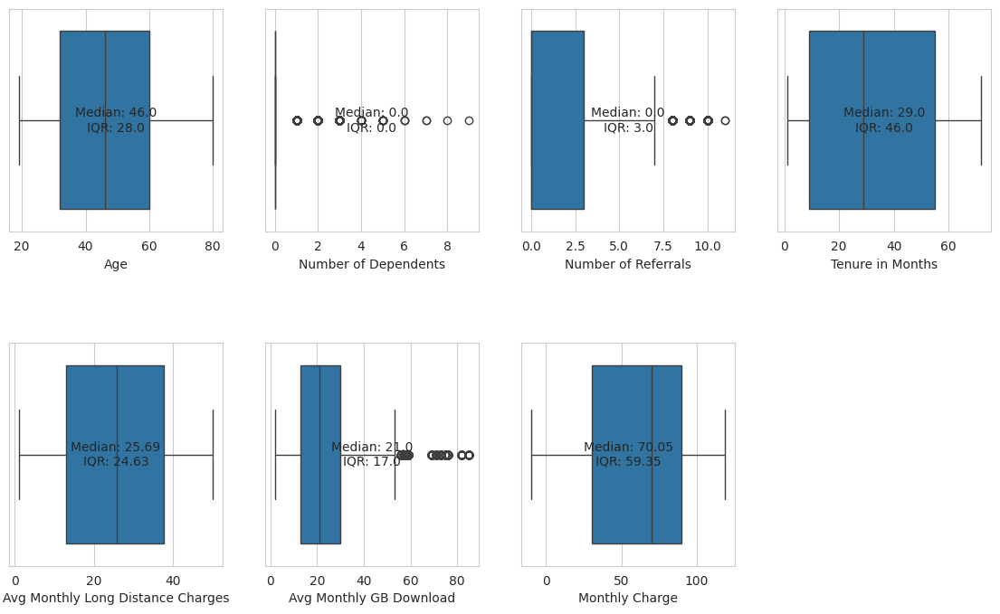

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming 'df' is your DataFrame

# Create a subplot grid with 2 rows and 4 columns
fig, axs = plt.subplots(nrows=2, ncols=4, figsize=(14, 8))

# Plot each box plot in a separate subplot
sns.boxplot(x=df['Age'], ax=axs[0, 0])
sns.boxplot(x=df['Number of Dependents'], ax=axs[0, 1])
sns.boxplot(x=df['Number of Referrals'], ax=axs[0, 2])
sns.boxplot(x=df['Tenure in Months'], ax=axs[0, 3])
sns.boxplot(x=df['Avg Monthly Long Distance Charges'], ax=axs[1, 0])
sns.boxplot(x=df['Avg Monthly GB Download'], ax=axs[1, 1])
sns.boxplot(x=df['Monthly Charge'], ax=axs[1, 2])



# Hide the empty subplot in the last position
axs[1, 3].axis('off')

# Adjust spacing between subplots
plt.subplots_adjust(hspace=0.5)

# Show the plots
plt.show()


Box Plot Interpretations:
Age:We have a huge range of customers all the way from 20+ to 85 year olds, with the middle 50% falling between 25-60,again a huge range.
Number of Dependants: The box plot for the "Number of Dependents" variable reveals a distribution highly skewed towards lower values, particularly 0, as indicated by the small size of the box. This suggests that the majority of the data points in your dataset have no dependents. But the customers who do are important as we can introduce some family plans to retain these customers.
Number of Referrals:The box plot is again skewed towards lower values but within the range of 0-2.5. The important customers here are actually the outliers as they are loyal and will market the company through word of mouth.
Tenure in Months: The median is 29 months while 75% of our customers use the comapny's services for more than 55 months. This is a significant achievement.
Average Monthly Long Distance Charges: Customers pay relatively moderate long-distance charges, with the median around $25.69 and 75% of customers paying less than $40 per month
Average Monthly GB download: Median is 17 GB while 75% of customers use 30GB of data, our interest again lies in the outlier customers to whom internet packages can be targeted.
Monthly Charge: Median is 70$ while 25% pay under 40$.These are significant portion of customers who can be targeted with different services so we can generrate more revenue

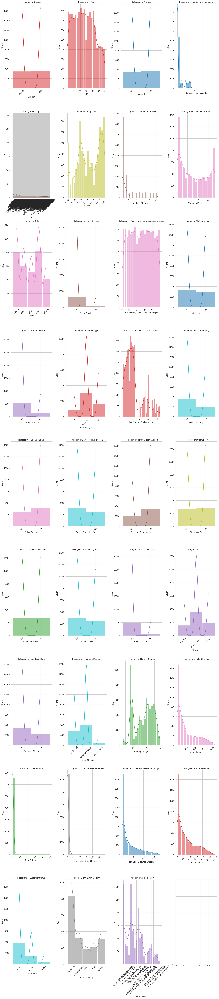

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import random

def plot_multiple_histograms(columns, df, graphs_per_row, fontsize, rotation):
    # Calculate the number of rows needed
    num_rows = (len(columns) + graphs_per_row - 1) // graphs_per_row

    # Set the style of the plots
    sns.set_style('whitegrid')

    # Create subplots for each histogram
    fig, axs = plt.subplots(num_rows, graphs_per_row, figsize=(20, 10*num_rows))

    for i, col in enumerate(columns):
        color = sns.color_palette()[random.randint(0, len(sns.color_palette()) - 1)]
        row_idx = i // graphs_per_row
        col_idx = i % graphs_per_row



        # Plot histogram for the current column
        sns.histplot(df[col], ax=axs[row_idx, col_idx], kde=True, color=color)

        axs[row_idx, col_idx].set_title(f'Histogram of {col}', fontsize=fontsize)
        axs[row_idx, col_idx].tick_params(axis='both', which='major', labelsize=fontsize)
        axs[row_idx, col_idx].tick_params(axis='x', rotation=rotation)
        axs[row_idx, col_idx].set_xlabel(col, fontsize=fontsize)
        axs[row_idx, col_idx].set_ylabel('Count', fontsize=fontsize)

    # Adjust layout
    plt.tight_layout()
    plt.show()

# Example usage:
# Assuming df is your DataFrame containing the data
# Replace 'df' with your actual DataFrame name if different
# df = pd.DataFrame()  # Replace with your DataFrame
columns = [ 'Gender', 'Age', 'Married', 'Number of Dependents',
           'Number of Referrals', 'Tenure in Months', 'Offer', 'Phone Service',
           'Avg Monthly Long Distance Charges', 'Multiple Lines', 'Internet Service', 'Internet Type',
           'Avg Monthly GB Download', 'Online Security', 'Online Backup', 'Device Protection Plan',
           'Premium Tech Support', 'Streaming TV', 'Streaming Movies', 'Streaming Music', 'Unlimited Data',
           'Contract', 'Paperless Billing', 'Payment Method', 'Monthly Charge', 'Total Charges', 'Total Refunds',
           'Total Extra Data Charges', 'Total Long Distance Charges', 'Total Revenue', 'Customer Status',
           'Churn Category', 'Churn Reason']

# Define the number of graphs per row and label settings
graphs_per_row = 4
labels_size = 12
labels_rotation = 45

plot_multiple_histograms(columns, df, graphs_per_row, labels_size, labels_rotation)


Gender:Both Male and Females use our services and there isnt a significant gap .
Married: Gap between married and unmarried customers is pretty much negligible.
Age: Similar to box and whisker plot interpreation, we see that that have a huge range of customers age-wise
Number of Referrals: Similar to box and whisker plot interpreation, we see that that most customers have 0 referrals, we need to improve services so that customers are more likely to recommend our company to others. Meanwhile customers with greater than 8 referrals are our high value customers.
offer: Customers were targeted most with offer B followed by offer E, we can later explore the affect of these offfers on the churn rate.
Phone Service: Most customers are using our phone service which is a good indicator.
Average Monthly Long Distance Charges:The spread of customers is quite spread out, with most customers being charged 16-18$.
Internet Service: Most customers are using the internet service which is a postive indicator.
Internet Type: Most customers are using fibre optic, this means customers are satisified with it, while cable isnt used a lot so its affect can be explored on churn rate.
Online Backup:More customers have opted for not having an online backup,this means we need to look into our online backup service and make sure it is up to standard, this could be one of the factors why customers are churning
Device Protection Plan:More customers have opted for not having a device protection plan,this means we need to look into our device protection service and make sure it is up to standard,this could be one of the factors why customers are churning
Premium Tech Support:More customers have opted for not having a device protection plan,this means we need to look into our premium tech support service and make sure it is up to standard,this could be one of the factors why customers are churning.
Streaming Music: Again around 50% of customers arent utlizing the stream music service,this could be one of the factors why customers are churning.
Streaming Movies: More than50% of customers arent utlizing the stream movies service,this could be one of the factors why customers are churning.
Unlimited Data:Most customers are utlizing this service which is a positive indicator
Paperless Billing:Significant portion of customers have not opted for using paperless billing despite it being more convenient,the process needs to be investigated.
Customer Status: Significant portion of customers have churned, and these are more than those who have joined which is leading to huge losses to the company.
Churn category: Most customers are leacing in favour of the competitior's products,this needs to be promptly investigated into and it needs to be made sure our products are better than our competitors or we offer them at a better price to retain customers.






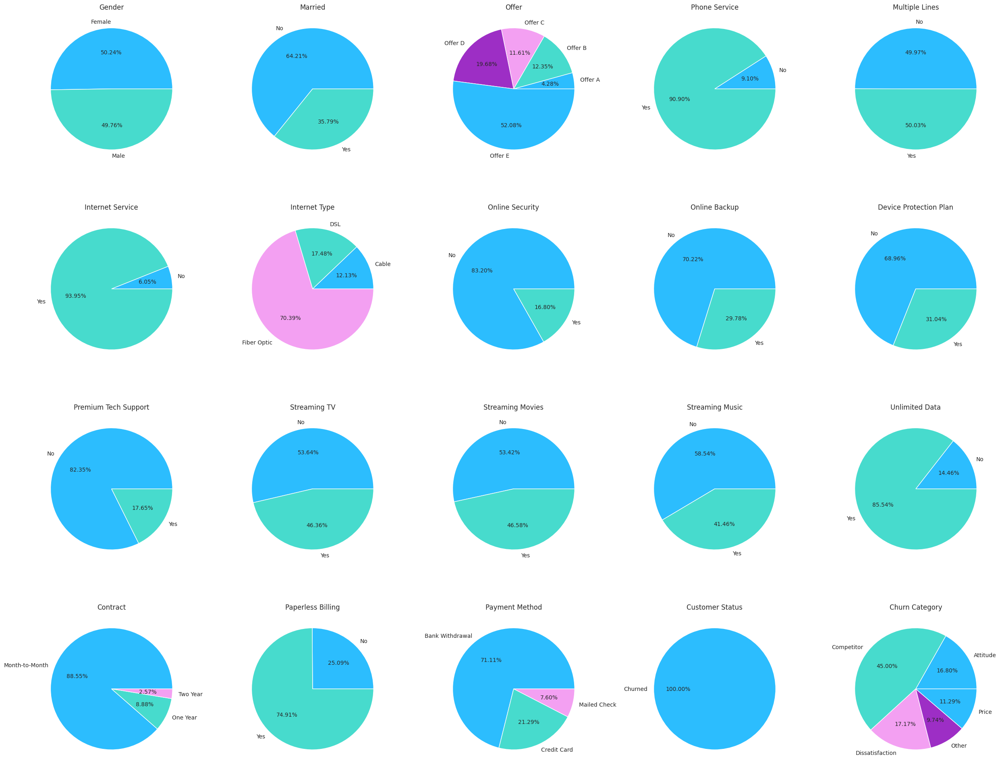

In [ ]:
import matplotlib.pyplot as plt

# Define green-blue color scheme
green_blue_colors = ['#2CBDFE', '#47DBCD', '#F3A0F2', '#9D2EC5']

df_churned = df[df['Customer Status'] == 'Churned']

# Extract categorical columns excluding 'Customer ID', 'Latitude', 'Longitude', 'Zipcode', 'City'
cat_columns = [col for col in df_churned.columns if col not in ['Customer ID', 'Latitude', 'Longitude', 'Zipcode', 'City','Churn Reason'] and df_churned[col].dtype == 'object']

# Create the figure for subplots
fig = plt.figure(figsize=(25, 25))

# Counter for subplot indexing
i = 1

# Loop through each categorical column for plotting pie charts
for x in cat_columns:
    plt.subplot(5, 5, i)
    ax = df_churned.groupby([x]).size().plot(kind='pie', autopct='%.2f%%', colors=green_blue_colors)
    ax.set(xlabel=None, ylabel=None)
    plt.title(str(x), loc='center')
    i += 1

plt.tight_layout()  # Adjust layout to prevent overlapping labels
plt.show()


We can notice that some feature are strongly responsible for this churn rate :

Offer : We should have a look at the offer type E because it has the worst churn rate
Service : Even though it looks like client who have either a phone service or an internet service are more likely to churn,it is because generally all our customers are using an internet service or phone service. So high churn rate cannot be solely attributed to these services.
Internet Type : The majority of churn customers are FiberOptic clients.
Features : the customers who are enrolled in Online security, Online Backup,Customers who don't have device Protection Plan,Premium Tech Support, Unlimited Data are less likely to churn
Contract : Clients with Monthly subscriptions and Bank Withdrawal are most likely to Churn of all others

<h1>Bivariate Analysis</h1>


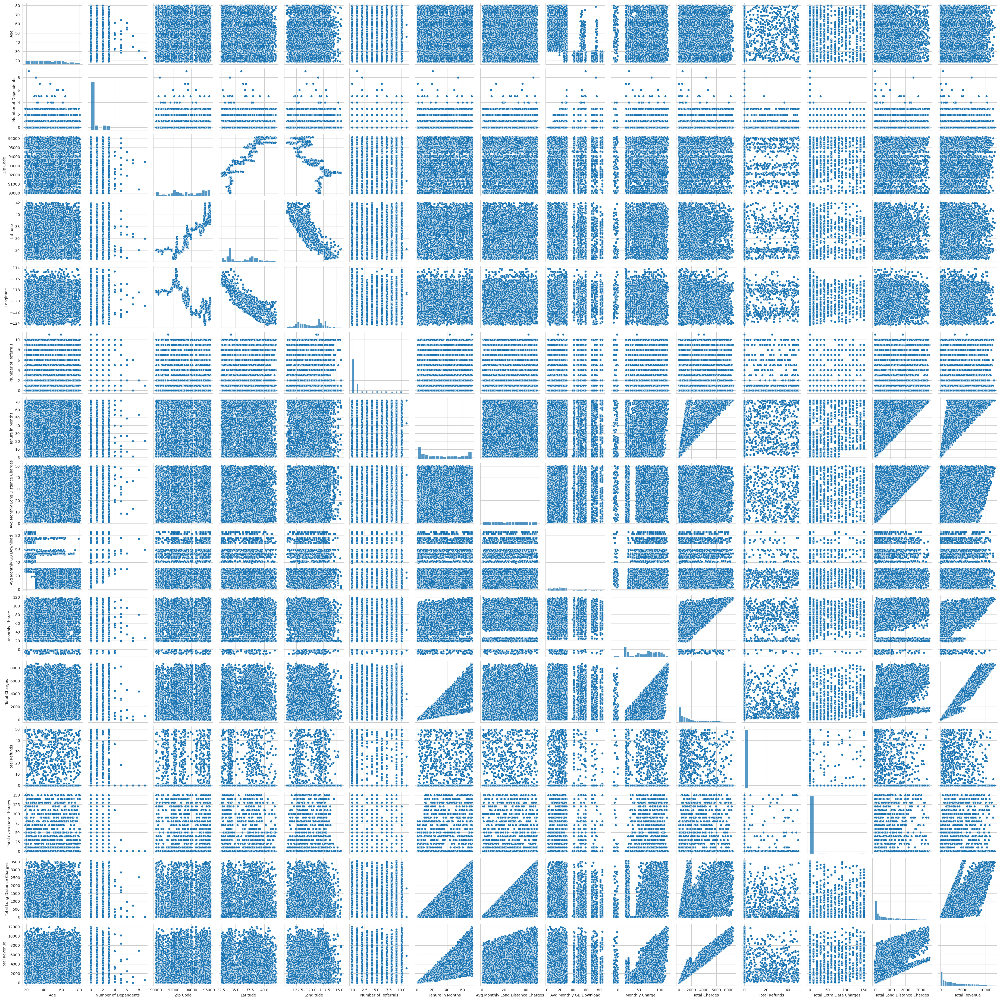

In [ ]:
sns.pairplot(df)

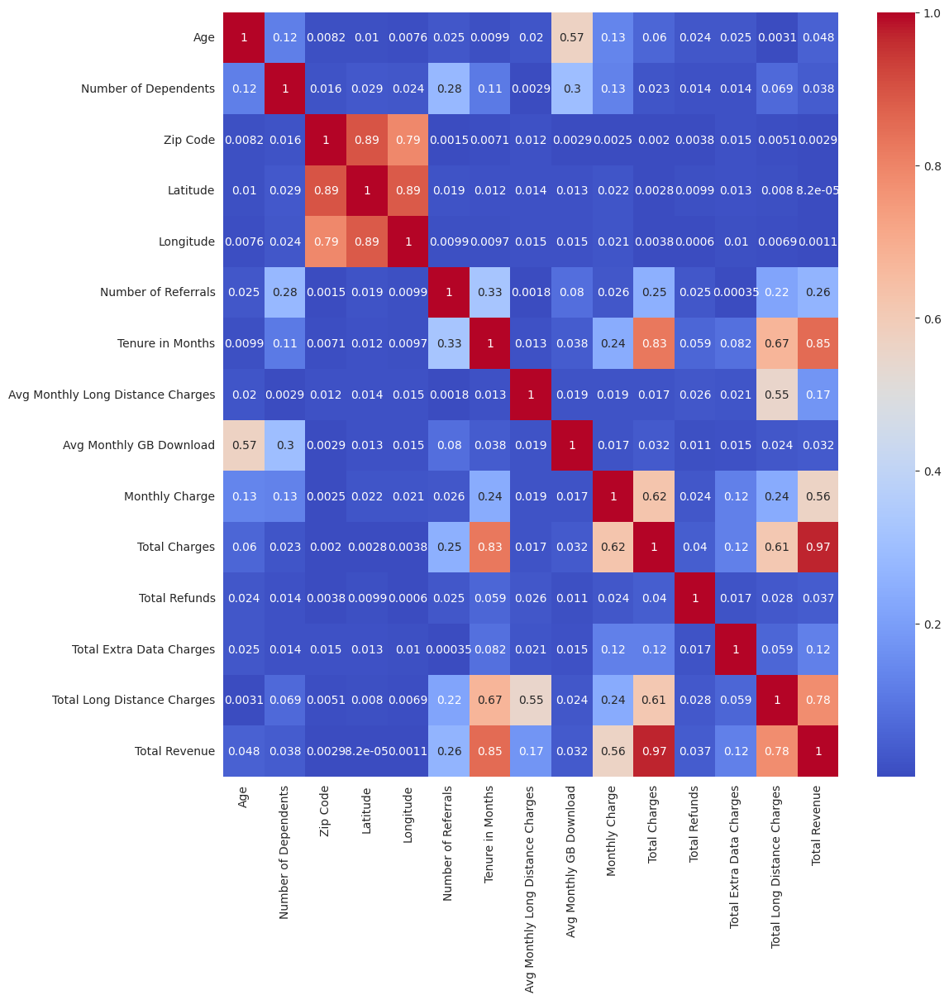

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming df is your DataFrame containing numerical and categorical columns
# Replace 'df' with your actual DataFrame name if different
df_num = df.select_dtypes('number')
df_object = df.select_dtypes('object')
# Select numerical columns for correlation calculation
numeric_cols = df.select_dtypes(include=['number']).columns

# Calculate correlation matrix for numerical columns
cor = df[numeric_cols].corr().abs()

# Drop 'Customer ID' column if it exists in the numerical columns
if 'Customer ID' in cor.index:
    cor = cor.drop(index='Customer ID', columns='Customer ID')

# Create a heatmap of correlations
fig, ax = plt.subplots(figsize=(12, 12))
sns.heatmap(cor, annot=True, ax=ax, cmap='coolwarm')
plt.show()


This heatmap shows us that there is no important corrolation between our varaibles apart from the ones that are pretty clear. For example, all features related to location will ofcourse be highly correlated, same goes for all features adding up to total revenue. Age and Avg Monthly GB Download have a correlation of 0.53 which is not very high but it can definitely be explored more in the dashboard

<h3>Statistical Tests</h3>

In [ ]:
from statsmodels.stats.multicomp import pairwise_tukeyhsd
from scipy.stats import chi2_contingency
from scipy.stats import chi2

In [ ]:
import pandas as pd
import numpy as np
from scipy.stats import f_oneway
from statsmodels.stats.multicomp import pairwise_tukeyhsd

def anova_and_tukey(df, target_col, other_cols):
    for col in other_cols:
        # Perform ANOVA test
        f_stat, p_val = f_oneway(*[group for name, group in df.groupby(col)[target_col]])
        print(f"ANOVA Test for {target_col} vs {col}: F-statistic = {f_stat:.4f}, p-value = {p_val:.2e}")

        # Perform Tukey HSD test if p-value is less than 0.05
        if p_val < 0.05:
            print(f"Since p value is less than 0.05 in the ANOVA Test, we reject the null hypothesis H0 and conclude that there are significant differences in the mean {target_col} across different {col} types.")

            # Perform Tukey HSD test
            tukey_result = pairwise_tukeyhsd(df[target_col], df[col])

            # Print Tukey HSD results
            print(tukey_result)
        else:
            print(f"Since p value is more than 0.05 in the ANOVA Test, we fail to reject the null hypothesis H0 and conclude that there are NO significant differences in the mean {target_col} across different {col} types.")
        print("-" * 50)

In [ ]:
columns_to_convert = ['Phone Service', 'Offer', 'Internet Service', 'Internet Type',
                      'Contract', 'Payment Method', 'Gender', 'Online Backup',
                      'Device Protection Plan', 'Premium Tech Support', 'Streaming TV',
                      'Streaming Movies', 'Streaming Music', 'Unlimited Data']

df[columns_to_convert] = df[columns_to_convert].astype(str)


In [ ]:
# Define target column and other columns array
target_column = 'Total Revenue'
other_columns = [ 'Phone Service','Offer','Internet Service','Internet Type','Contract','Payment Method','Gender','Online Backup','Device Protection Plan','Premium Tech Support','Streaming TV','Streaming Movies','Streaming Music','Unlimited Data']


# Call the function
anova_and_tukey(df, target_column, other_columns)

ANOVA Test for Total Revenue vs Phone Service: F-statistic = 221.8886, p-value = 1.97e-49
Since p value is less than 0.05 in the ANOVA Test, we reject the null hypothesis H0 and conclude that there are significant differences in the mean Total Revenue across different Phone Service types.
  Multiple Comparison of Means - Tukey HSD, FWER=0.05   
group1 group2  meandiff p-adj   lower     upper   reject
--------------------------------------------------------
    No    Yes 1693.3252   0.0 1470.4839 1916.1665   True
--------------------------------------------------------
--------------------------------------------------
ANOVA Test for Total Revenue vs Offer: F-statistic = 722.9030, p-value = 0.00e+00
Since p value is less than 0.05 in the ANOVA Test, we reject the null hypothesis H0 and conclude that there are significant differences in the mean Total Revenue across different Offer types.
     Multiple Comparison of Means - Tukey HSD, FWER=0.05      
 group1  group2  meandiff  p-adj    l

All features except gender have impact on revenue. For example for contract, these findings suggest that the type of contract (Month-to-Month, One Year, Two Year) significantly influences the Total Revenue generated, with longer-term contracts generally associated with higher Total Revenue

Phone Service:
ANOVA Test Result: F-statistic = 221.8886, p-value = 1.97e-49
Tukey HSD Result: The analysis indicates significant differences in Total Revenue across customers with and without Phone Service. Customers with Phone Service tend to have a notably higher mean Total Revenue compared to those without Phone Service.

Offer:
ANOVA Test Result: F-statistic = 722.9030, p-value = 0.00e+00
Tukey HSD Result: The findings reveal substantial variations in Total Revenue among different Offer types. Specifically, customers availing Offers A through E demonstrate distinct mean Total Revenues, with Offer E showing the highest mean revenue among the specified offers.

Internet Service:
ANOVA Test Result: F-statistic = 666.8764, p-value = 1.42e-140
Tukey HSD Result: Analysis highlights significant disparities in Total Revenue based on Internet Service availability. Customers with active Internet Service subscriptions exhibit considerably higher mean Total Revenue compared to those without Internet Service.

Internet Type:
ANOVA Test Result: F-statistic = 350.8873, p-value = 2.29e-212
Tukey HSD Result: The examination shows notable mean Total Revenue differences across various Internet Types. Fiber Optic customers typically show the highest mean Total Revenue, followed by Cable and DSL users. Customers without a specified Internet Type tend to have lower mean Total Revenue compared to those with specified types.

Contract:
ANOVA Test Result: F-statistic = 1084.4766, p-value = 0.00e+00
Tukey HSD Result: The analysis reveals significant mean differences in Total Revenue across different Contract types. Customers with longer-term contracts (One Year and Two Year) exhibit notably higher mean Total Revenue compared to those with Month-to-Month contracts.

Payment Method:
ANOVA Test Result: F-statistic = 74.5893, p-value = 8.80e-33
Tukey HSD Result: Significant mean differences are observed in Total Revenue based on Payment Method. Customers using Bank Withdrawal tend to have higher mean Total Revenue compared to those using Credit Card or Mailed Check.

Gender:
ANOVA Test Result: F-statistic = 0.0689, p-value = 7.93e-01
Tukey HSD Result: The analysis indicates no significant differences in Total Revenue across different Gender types.

Online Backup:
ANOVA Test Result: F-statistic = 1113.1453, p-value = 0.00e+00
Tukey HSD Result: There are significant mean differences in Total Revenue across different Online Backup types. Customers with Online Backup tend to have higher mean Total Revenue compared to those without.

Device Protection Plan
ANOVA Test Result: F-statistic = 1119.1994, p-value = 0.00e+00
Tukey HSD Result: Significant mean differences exist in Total Revenue across different Device Protection Plan types. Customers with Device Protection Plans demonstrate higher mean Total Revenue compared to those without.

Premium Tech Support:
ANOVA Test Result: F-statistic = 805.4885, p-value = 9.69e-316
Tukey HSD Result: Significant mean differences exist in Total Revenue across different Premium Tech Support types. Customers with Premium Tech Support tend to have the highest mean Total Revenue, followed by those without Premium Tech Support. Customers without a specified Tech Support type (nan) exhibit lower mean Total Revenue compared to those with specified types.

Streaming TV:
ANOVA Test Result: F-statistic = 1027.9109, p-value = 0.00e+00
Tukey HSD Result: The analysis indicates significant mean differences in Total Revenue across different Streaming TV types. Customers with Streaming TV have higher mean Total Revenue compared to those without.

Streaming Movies:
ANOVA Test Result: F-statistic = 1052.1564, p-value = 0.00e+00
Tukey HSD Result: Significant mean differences are observed in Total Revenue across different Streaming Movies types. Customers with Streaming Movies have higher mean Total Revenue compared to those without.

Streaming Music:
ANOVA Test Result: F-statistic = 765.0018, p-value = 2.30e-301
Tukey HSD Result: There are significant mean differences in Total Revenue across different Streaming Music types. Customers with Streaming Music have higher mean Total Revenue compared to those without.

Unlimited Data:
ANOVA Test Result: F-statistic = 333.3934, p-value = 4.59e-139
Tukey HSD Result: Significant mean differences exist in Total Revenue across different Unlimited Data types. Customers with Unlimited Data (Yes) have slightly lower mean Total Revenue compared to those without Unlimited Data. Customers without specified Unlimited Data type (nan) also demonstrate lower mean Total Revenue compared to those with specified types.

In [ ]:
from scipy.stats import chi2_contingency
#use this function for chi square test amongst some columns
def chi_square_test(df, target_col, other_cols):
    for col in other_cols:
        # Create a contingency table
        contingency_table = pd.crosstab(df[col], df[target_col])

        # Perform Chi-square test
        chi2_stat, p_val, dof, _ = chi2_contingency(contingency_table)
        print(f"Chi-square Test for {target_col} vs {col}:")
        print(f"Contingency Table:")
        print(contingency_table)
        print(f"Degrees of Freedom: {dof}")
        print(f"Chi2-statistic = {chi2_stat:.4f}, p-value = {p_val:.2e}")

        # Interpret the results based on the p-value threshold
        if p_val < 0.05:
            print(f"Since p value is less than 0.05 in the Chi-square Test, we reject the null hypothesis H0 and conclude that there is an association between {target_col} and {col}.")
        else:
            print(f"Since p value is more than 0.05 in the Chi-square Test, we fail to reject the null hypothesis H0 and conclude that there is NO association between {target_col} and {col}.")
        print("-" * 50)



In [ ]:
# Example usage

# Define target column and other columns array
target_column = 'Customer Status'
other_columns = ['Phone Service', 'Offer',
       'Internet Service','Internet Type','Contract','Payment Method']

# Call the function
chi_square_test(df, target_column, other_columns)

Chi-square Test for Customer Status vs Phone Service:
Contingency Table:
Customer Status  Churned  Joined  Stayed
Phone Service                           
No                   170      38     474
Yes                 1699     416    4246
Degrees of Freedom: 2
Chi2-statistic = 2.3288, p-value = 3.12e-01
Since p value is more than 0.05 in the Chi-square Test, we fail to reject the null hypothesis H0 and conclude that there is NO association between Customer Status and Phone Service.
--------------------------------------------------
Chi-square Test for Customer Status vs Offer:
Contingency Table:
Customer Status  Churned  Joined  Stayed
Offer                                   
Offer A               35       0     485
Offer B              101       0     723
Offer C               95       0     320
Offer D              161       0     441
Offer E              426     175     204
nan                 1051     279    2547
Degrees of Freedom: 10
Chi2-statistic = 1127.2667, p-value = 6.98e-236


We only explored columns of relevance, here we need to find out exactly the imapct of these feature on customer retention and churning.

Customer Status vs Phone Service:
Description: The Chi-square test indicates that there is no statistically significant association between Customer Status (Churned, Joined, Stayed) and Phone Service (No, Yes).

Customer Status vs Offer:
Offer E is strongly associated with Churned customers (426), while Offer A is primarily linked to Stayed customers (485). Joined customers show associations with Offer E (175) and Offer A (0). Offer D also correlates notably with Churned customers (161). Offers B and C display lower associations across the customer statuses.

Customer Status vs Internet Service:
The Chi-square test indicates a significant association between Customer Status (Churned, Joined, Stayed) and Internet Service (No, Yes). Churned customers are notably associated with having Internet Service, while Stayed customers show a higher presence of No Internet Service.

Customer Status vs Internet Type:
There is a strong association between Customer Status (Churned, Joined, Stayed) and Internet Type (Cable, DSL, Fiber Optic, nan). Churned customers are more prevalent in Fiber Optic and DSL categories, while Cable and nan categories show varied associations across customer statuses.

Customer Status vs Contract:
The Chi-square test reveals a significant association between Customer Status (Churned, Joined, Stayed) and Contract types (Month-to-Month, One Year, Two Year). Churned customers are more prominent in Month-to-Month contracts, while Two Year contracts are associated with a higher number of Stayed customers.

Customer Status vs Payment Method:
The Chi-square test indicates a significant association between Customer Status (Churned, Joined, Stayed) and Payment Method (Bank Withdrawal, Credit Card, Mailed Check). Churned customers are notably associated with Bank Withdrawal, while Credit Card and Mailed Check show varied associations across customer statuses.

In [ ]:
import pandas as pd
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

def regression_analysis(df, target_column):
   # Select only numerical columns (int and float)
    numerical_cols = df.select_dtypes(include=['int', 'float']).columns.tolist()

    # Remove the target column from numerical_cols if it's in the list
    if target_column in numerical_cols:
        numerical_cols.remove(target_column)

    # Separate features (independent variables) and target variable
    X = df[numerical_cols]
    y = df[target_column]


    # Initialize and fit the linear regression model
    model = LinearRegression()
    model.fit(X, y)

    # Make predictions
    y_pred = model.predict(X)

    # Calculate metrics
    mse = mean_squared_error(y, y_pred)
    r2 = r2_score(y, y_pred)


    # Print regression results
    print(f"Regression Analysis for '{target_column}' (Numerical Columns Only):")
    print("Coefficients:")
    for col, coef in zip(numerical_cols, model.coef_):
        print(f"{col}: {coef}")
    print("Intercept:", model.intercept_)
    print("Mean Squared Error (MSE):", mse)
    print("R-squared (R2):", r2)

    # Plot actual vs. predicted values
    plt.figure(figsize=(8, 6))
    plt.scatter(y, y_pred)
    plt.plot([min(y), max(y)], [min(y), max(y)], linestyle='--', color='red')
    plt.xlabel('Actual Values')
    plt.ylabel('Predicted Values')
    plt.title('Actual vs. Predicted Values')
    plt.grid(True)
    plt.show()





Regression Analysis for 'Total Revenue' (Numerical Columns Only):
Coefficients:
Age: 5.76417281916831
Number of Dependents: -147.99781219705284
Number of Referrals: -4.363243220476129
Tenure in Months: 100.36585055157423
Intercept: -406.35455065015594
Mean Squared Error (MSE): 2199982.777570578
R-squared (R2): 0.7319784669895764


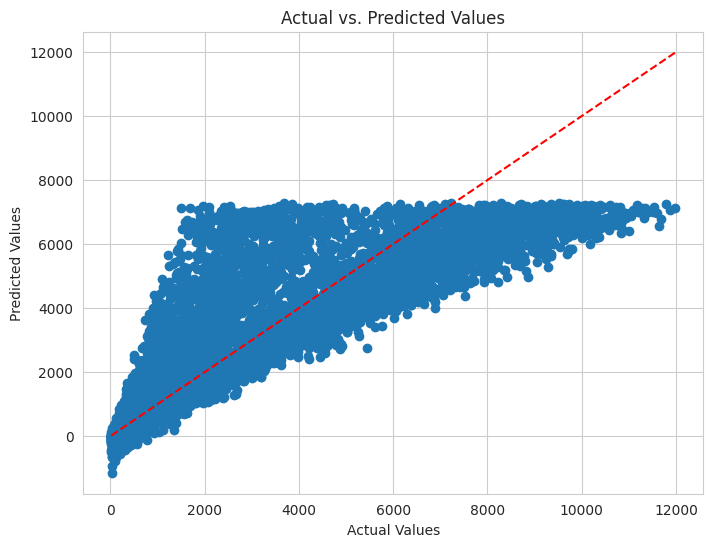

In [ ]:
# Example usage:
# Assuming 'df' is your DataFrame and 'Popularity' is the target column
# Replace 'df' and 'Popularity' with your actual DataFrame and target column name if different
# List of columns to keep
columns_to_keep = ['Gender', 'Age', 'Married', 'Number of Dependents', 'Number of Referrals',
                   'Tenure in Months', 'Offer', 'Phone Service', 'Internet Service', 'Contract',
                   'Paperless Billing', 'Payment Method', 'Customer Status','Total Revenue']

# Filter the DataFrame to keep only the specified columns
df_filtered = df[columns_to_keep].copy()
regression_analysis(df_filtered, 'Total Revenue')

In this regression analysis for 'Total Revenue', the coefficients represent the impact of each predictor variable on the predicted total revenue, this will be very helpful to us for indentifying which features should be taken into account for high value customers:

Age: For every unit increase in age, the predicted total revenue increases by approximately $5.76.

Number of Dependents: With each additional dependent, the predicted total revenue decreases by about $148.

Number of Referrals: Each additional referral is associated with a decrease of approximately $4.36 in predicted total revenue.

Tenure in Months: For each month of tenure, the predicted total revenue increases by approximately $100.37.

The intercept of -406.35 indicates the estimated total revenue when all predictor variables are zero.

The Mean Squared Error (MSE) of 2199982.78 reflects the average squared difference between the actual total revenue values and the predicted values by the model, with lower values indicating better model performance.

The R-squared (R2) value of 0.73 indicates that approximately 73% of the variability in total revenue can be explained by the predictor variables in the model, suggesting a moderately strong relationship between the predictors and the total revenue outcome.

In [ ]:
telco_data_dummies = pd.get_dummies(df)
telco_data_dummies.head()

,Age,Number of Dependents,Zip Code,Latitude,Longitude,Number of Referrals,Tenure in Months,Avg Monthly Long Distance Charges,Avg Monthly GB Download,Monthly Charge,...,Churn Reason_Lack of self-service on Website,Churn Reason_Limited range of services,Churn Reason_Long distance charges,Churn Reason_Moved,Churn Reason_Network reliability,Churn Reason_Poor expertise of online support,Churn Reason_Poor expertise of phone support,Churn Reason_Price too high,Churn Reason_Product dissatisfaction,Churn Reason_Service dissatisfaction
0,37,0,93225,34.827662,-118.999073,2,9,42.39,16.0,65.6,...,False,False,False,False,False,False,False,False,False,False
1,46,0,91206,34.162515,-118.203869,0,9,10.69,10.0,-4.0,...,False,False,False,False,False,False,False,False,False,False
2,50,0,92627,33.645672,-117.922613,0,4,33.65,30.0,73.9,...,False,False,False,False,False,False,False,False,False,False
3,78,0,94553,38.014457,-122.115432,1,13,27.82,4.0,98.0,...,False,False,False,False,False,False,False,False,True,False
4,75,0,93010,34.227846,-119.079903,3,3,7.38,11.0,83.9,...,False,False,False,False,True,False,False,False,False,False


In [ ]:
import pandas as pd

# Assuming your dataset is stored in a DataFrame named df
# Create a new column 'Churn' and set it based on 'Customer Status'
df1 =df.copy()
df1['Churn'] = df1['Customer Status'].apply(lambda x: 'Yes' if x == 'Churned' else 'No')
# Assuming 'telecom_customer_churn' is your DataFrame
df1['Age Group'] = pd.cut(
    df1['Age'],
    bins=[10, 20, 30, 40, 50, 60, 70, 80, 90],
    labels=["10-19 years", "20-29 years", "30-39 years", "40-49 years", "50-59 years", "60-69 years", "70-79 years", "80-90 years"],
    right=False
)
# Create the 'Tenure Category' column using pd.cut
df1['Tenure Category'] = pd.cut(df1['Tenure in Months'], bins=[-1, 11, 23, 35, 47, 59, 71, 83, 95, float('inf')],
                                labels=["Less than a year", "1-2 years", "2-3 years", "3-4 years", "4-5 years",
                                        "5-6 years", "6-7 years", "7-8 years", "More than 8 years"])

# Display the updated DataFrame with the new 'Churn' column
print(df1)


     Customer ID  Gender  Age Married  Number of Dependents          City  \
0     0002-ORFBO  Female   37     Yes                     0  Frazier Park   
1     0003-MKNFE    Male   46      No                     0      Glendale   
2     0004-TLHLJ    Male   50      No                     0    Costa Mesa   
3     0011-IGKFF    Male   78     Yes                     0      Martinez   
4     0013-EXCHZ  Female   75     Yes                     0     Camarillo   
...          ...     ...  ...     ...                   ...           ...   
7038  9987-LUTYD  Female   20      No                     0       La Mesa   
7039  9992-RRAMN    Male   40     Yes                     0     Riverbank   
7040  9992-UJOEL    Male   22      No                     0           Elk   
7041  9993-LHIEB    Male   21     Yes                     0  Solana Beach   
7042  9995-HOTOH    Male   36     Yes                     0   Sierra City   

      Zip Code   Latitude   Longitude  Number of Referrals  ...  \
0       

In [ ]:
#dropping columns which dont need to be included in correlation chart
columns_to_drop = ['Zip Code', 'City', 'Latitude', 'Longitude', 'Customer ID','Customer Status','Churn Category','Churn Reason']
df1.drop(columns=columns_to_drop, inplace=True)

In [ ]:
#one hot encoding to perform correlation on categorical variables
telco_data_dummies = pd.get_dummies(df1)


,Age,Number of Dependents,Number of Referrals,Tenure in Months,Avg Monthly Long Distance Charges,Avg Monthly GB Download,Monthly Charge,Total Charges,Total Refunds,Total Extra Data Charges,...,Age Group_80-90 years,Tenure Category_Less than a year,Tenure Category_1-2 years,Tenure Category_2-3 years,Tenure Category_3-4 years,Tenure Category_4-5 years,Tenure Category_5-6 years,Tenure Category_6-7 years,Tenure Category_7-8 years,Tenure Category_More than 8 years
0,37,0,2,9,42.39,16.0,65.6,593.30,0.00,0,...,False,True,False,False,False,False,False,False,False,False
1,46,0,0,9,10.69,10.0,-4.0,542.40,38.33,10,...,False,True,False,False,False,False,False,False,False,False
2,50,0,0,4,33.65,30.0,73.9,280.85,0.00,0,...,False,True,False,False,False,False,False,False,False,False
3,78,0,1,13,27.82,4.0,98.0,1237.85,0.00,0,...,False,False,True,False,False,False,False,False,False,False
4,75,0,3,3,7.38,11.0,83.9,267.40,0.00,0,...,False,True,False,False,False,False,False,False,False,False


<Axes: >

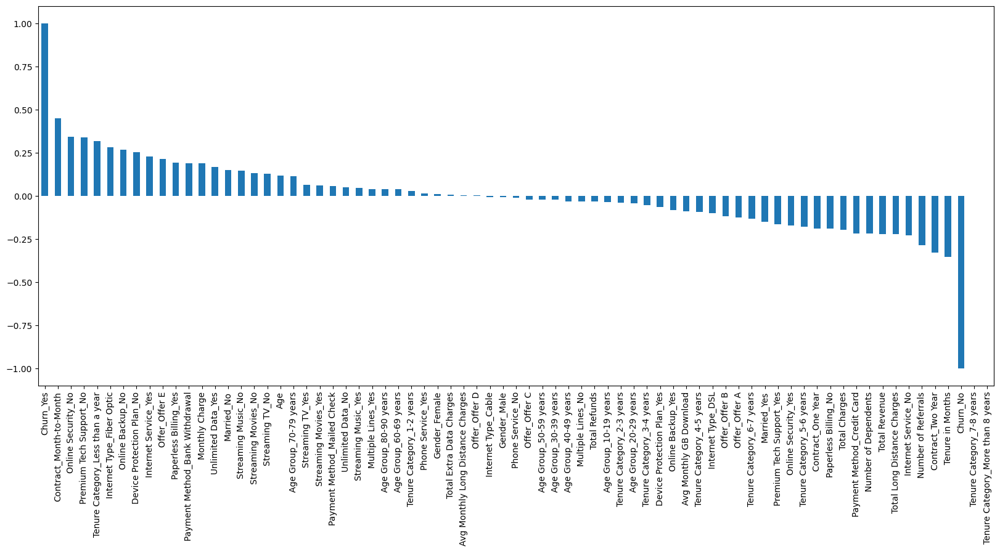

In [ ]:
from tabulate import tabulate
plt.figure(figsize=(20,8))

telco_data_dummies.corr()['Churn_Yes'].sort_values(ascending = False).plot(kind='bar')



In [ ]:
# Calculate correlation and sort
correlation = telco_data_dummies.corr()['Churn_Yes'].sort_values(ascending=False)
# Create a table using tabulate
table = tabulate(correlation.to_frame(), headers=['Correlation'], tablefmt='pretty')


print(table)

+-----------------------------------+-----------------------+
|                                   |      Correlation      |
+-----------------------------------+-----------------------+
|             Churn_Yes             |          1.0          |
|      Contract_Month-to-Month      |  0.4484265331848105   |
|        Online Security_No         |  0.3426367998511234   |
|      Premium Tech Support_No      |  0.3372807277351978   |
| Tenure Category_Less than a year  |  0.31766596916204964  |
|     Internet Type_Fiber Optic     |  0.27962314108317105  |
|         Online Backup_No          |  0.26800518096236076  |
|     Device Protection Plan_No     |  0.25248136059568493  |
|       Internet Service_Yes        |  0.22789044975609302  |
|           Offer_Offer E           |  0.21464817547264883  |
|       Paperless Billing_Yes       |  0.19182533166646792  |
|  Payment Method_Bank Withdrawal   |  0.18873308008099737  |
|          Monthly Charge           |  0.18783277120269598  |
|       

We now have a list of all factors which contribute the most to churned customers. This correlation chart aligns with our findings from the statistical tests where for example,month on month contracts were the most contributing factor to churned customers followed by no online security and no premium tech support.